Qué es el aprendizaje supervisado-Aprende a partir de ejemplos etiquetados, una recompensa o penalización.  Exploración y Explotación-Probar acciones nuevas (curiosidad), Usar lo que ya se aprendió (experiencia).  En la simulación del auto:

Exploración → el auto gira aleatoriamente a la izquierda, derecha o sigue recto.

Explotación → el auto sigue la acción que su modelo predice como mejor.

El balance entre ambos se maneja con ε (épsilon):

Con probabilidad ε, el agente explora.

Con probabilidad 1 - ε, el agente explota lo aprendido.  La Q y q en este contexto-
ε-greedy	Estrategia que mezcla exploración y explotación.
Q(s, a)	Valor esperado de tomar acción a en estado s.
q(s, a; θ)	Estimación aprendida de Q mediante un modelo.  Conexión con tu simulación del auto

Codigo:

El modelo supervisado (LinearRegression) actúa como una función q(s) que aprende a estimar la acción correcta.

El ε-greedy añade el componente de exploración/explotación típico del aprendizaje por refuerzo.

Aunque no hay tabla Q explícita, el modelo va aprendiendo una relación entre posición y acción, equivalente a una política aprendida Q(s, a) simplificada.

Cada vez que el auto se desvía, el modelo “supervisado” aprende a corregir el error (y_train = -X_train),
y el ε-greedy lo hace decidir si probar algo nuevo o seguir su predicción.

Qué representa este Juego?

Imagina un auto que intenta mantenerse en el centro de una carretera recta
El auto no sabe conducir al principio, solo puede hacer tres cosas:

Girar a la izquierda (-1)

Seguir recto (0)

Girar a la derecha (+1)

La carretera va de -5 (izquierda total) a +5 (derecha total), y el centro es 0.

Su objetivo es permanecer lo más cerca posible de 0
(es decir, minimizar su error lateral).

Qué aprende el auto

Cada vez que se mueve, el auto observa:

Su posición actual → current_pos

Qué acción toma → action

Qué tan bien le fue → (mide el error con respecto al centro)

El auto usa eso para entrenar un modelo supervisado (una regresión lineal),
que intenta aprender qué acción tomar en función de su posición.
Ese modelo se llama Q (es su conocimiento acumulado).


“Si estoy muy a la izquierda, debo girar a la derecha.
Si estoy muy a la derecha, debo girar a la izquierda.”

Importamos librerías:

numpy: operaciones matemáticas.

matplotlib.pyplot: para graficar resultados.

LinearRegression: el modelo que aprende

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

Fija una semilla aleatoria para que los resultados sean reproducibles (el “ruido” siempre igual).

In [32]:
np.random.seed(42)

Esta función simula el movimiento del auto:

position: dónde está el auto (−5 = muy izquierda, +5 = muy derecha).

action: dirección que decide tomar (−1 = izquierda, 0 = recto, +1 = derecha).

noise: agrega variación aleatoria para hacerlo más realista.

np.clip: evita que el auto se salga de los límites de la carretera.

 Resultado: devuelve la nueva posición después del movimiento.

In [33]:

# El "auto" se mueve sobre una carretera de ancho 10 (centro = 0)
# Estado = posición actual respecto al centro
# Acción = giro (izquierda = -1, recto = 0, derecha = +1)
# Recompensa = -|posición| (penaliza desviarse)

def move_car(position, action):
    """Actualiza la posición según la acción tomada"""
    noise = np.random.normal(0, 0.1)  # ruido del entorno, medio y desviacion estandar
    new_position = position + action + noise
    return np.clip(new_position, -5, 5)  # límites de la carretera

# Datos base (supervisado): posiciones y acciones correctas ideales
X = np.linspace(-5, 5, 100).reshape(-1, 1)
y = -X  # acción ideal = girar hacia el lado contrario del error (control proporcional)

Creamos un modelo lineal y lo inicializamos con solo 2 ejemplos (el auto “no sabe nada”).
Aprenderá progresivamente a partir de su experiencia.  epsilon: 30% de las veces explorará (toma decisiones al azar).
n_steps: cantidad de pasos que el auto dará (200 iteraciones).
positions: lista que guarda dónde estuvo el auto en cada paso.  errors: lista que guarda su error (qué tan lejos está del centro).

In [34]:

# ===============================================
# Entrenamiento con exploración y explotación
# ===============================================

model = LinearRegression()
X_train = X[:2]
y_train = y[:2]     #prediccion

epsilon = 0.3        # 30% de exploración
n_steps = 200        # pasos
positions = [0]      # inicia en el centro
errors = []

El bucle principal de aprendizaje

In [35]:
for step in range(n_steps):
    # Entrenar modelo actual (supervisado)
    model.fit(X_train, y_train)

    # Estado actual
    current_pos = positions[-1]

    # Acción predicha (explotación)
    predicted_action = model.predict([[current_pos]])[0][0]

    # Política ε-greedy
    if np.random.rand() < epsilon:
        # Explorar: elige una acción aleatoria
        action = np.random.choice([-1, 0, 1])
    else:
        # Explotar: usa la acción predicha
        action = np.clip(np.round(predicted_action), -1, 1)

    # Mover el auto
    new_pos = move_car(current_pos, action)
    positions.append(new_pos)

    # Guardar el nuevo ejemplo (supervisado)
    X_train = np.vstack([X_train, [current_pos]])
    y_train = np.vstack([y_train, [-current_pos]])  # corrección ideal opuesta al error

    # Calcular error (distancia al centro)
    error = abs(new_pos)
    errors.append(error)

    # Decaimiento del epsilon
    epsilon = max(0.05, epsilon * 0.99)

# ===============================================
# Visualización de resultados
# ===============================================

Visualización de resultados.     

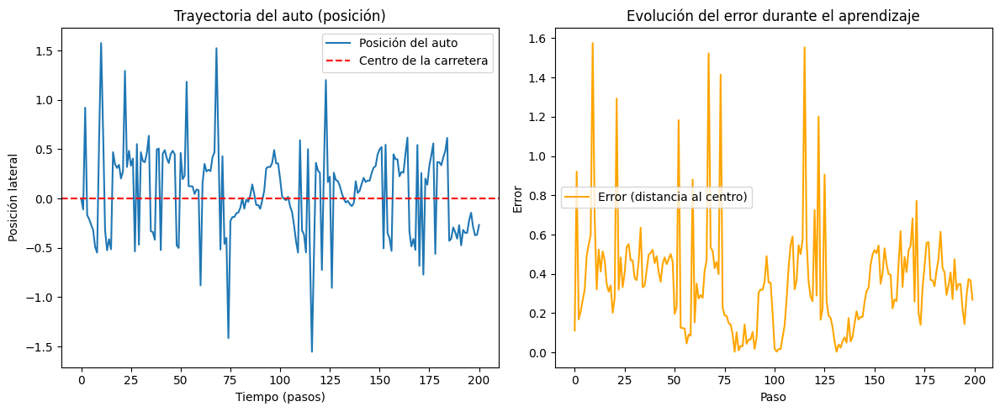

In [36]:
plt.figure(figsize=(12,5))
# Muestra cómo varía la posición del auto a lo largo del tiempo. Si el auto aprendió bien → la línea azul se mantiene cerca de la roja (centro).
plt.subplot(1,2,1)
plt.plot(positions, label="Posición del auto")
plt.axhline(0, color='r', linestyle='--', label="Centro de la carretera")
plt.title("Trayectoria del auto (posición)")
plt.xlabel("Tiempo (pasos)")
plt.ylabel("Posición lateral")
plt.legend()
# Muestra cómo disminuye el error con el tiempo (aprendizaje exitoso).
plt.subplot(1,2,2)
plt.plot(errors, color='orange', label="Error (distancia al centro)")
plt.title("Evolución del error durante el aprendizaje")
plt.xlabel("Paso")
plt.ylabel("Error")
plt.legend()

plt.tight_layout()
plt.show()


Imprime que el entrenamiento acabó y muestra el error promedio final
(de los últimos 50 pasos, para ver si ya se estabilizó).

In [37]:
print("✅ Entrenamiento terminado.")
print(f"Error promedio final: {np.mean(errors[-50:]):.3f}")

✅ Entrenamiento terminado.
Error promedio final: 0.401


In [38]:
# ===============================================
# 🎬 4️⃣ Animación del proceso
# ===============================================

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(10, 4))
ax.set_xlim(0, n_steps)
ax.set_ylim(-5.5, 5.5)
ax.set_xlabel("Tiempo (pasos)")
ax.set_ylabel("Posición lateral")
ax.set_title("🚗 Aprendizaje supervisado con exploración y explotación (ε-greedy)")

# Línea del centro
ax.axhline(0, color='r', linestyle='--', label='Centro de la carretera')

# Elementos visuales
car_dot, = ax.plot([], [], 'bo', markersize=10, label="Auto")
trail, = ax.plot([], [], 'b-', alpha=0.4)
text_step = ax.text(0.02, 0.92, '', transform=ax.transAxes)
text_eps = ax.text(0.02, 0.86, '', transform=ax.transAxes)

ax.legend(loc="upper right")

# Función de inicialización (cuadro inicial vacío)
def init():
    car_dot.set_data([], [])
    trail.set_data([], [])
    text_step.set_text('')
    text_eps.set_text('')
    return car_dot, trail, text_step, text_eps

# Función que actualiza cada cuadro de la animación
def update(frame):
    x_vals = np.arange(frame + 1)
    y_vals = positions[:frame + 1]

    # ✅ CORREGIDO: set_data debe recibir secuencias (listas o arrays)
    car_dot.set_data([frame], [positions[frame]])

    trail.set_data(x_vals, y_vals)
    text_step.set_text(f"Paso: {frame}")
    text_eps.set_text(f"Epsilon: {epsilon:.2f}")
    return car_dot, trail, text_step, text_eps

# Crear la animación
ani = FuncAnimation(fig, update, frames=n_steps, init_func=init,
                    blit=True, interval=80, repeat=False)

plt.close()
HTML(ani.to_jshtml())

/tmp/ipython-input-3824786370.py:48: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  ani = FuncAnimation(fig, update, frames=n_steps, init_func=init,
/tmp/ipython-input-3824786370.py:52: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  HTML(ani.to_jshtml())
